In [1]:
import subprocess
import pyreadr
import allel; 
# print('scikit-allel', allel.__version__)
import numpy as np
import pandas as pd
from hmmlearn import hmm
import seaborn as sns
from itertools import compress,groupby
from functools import reduce
from sklearn.cluster import KMeans
from collections import *
import matplotlib as mpl
import matplotlib.pyplot as plt
# import matplotlib.gridspec as gridspec
from matplotlib.gridspec import GridSpec
from matplotlib.image import imread
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1 import make_axes_locatable
import scipy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
# random.seed(42)
import matplotlib.patches as mpl_patches
# for plot H
from IPython.display import Image
# in house scripts
from GTPlotUtil import *
import os

scikit-allel 1.3.13


# MDS

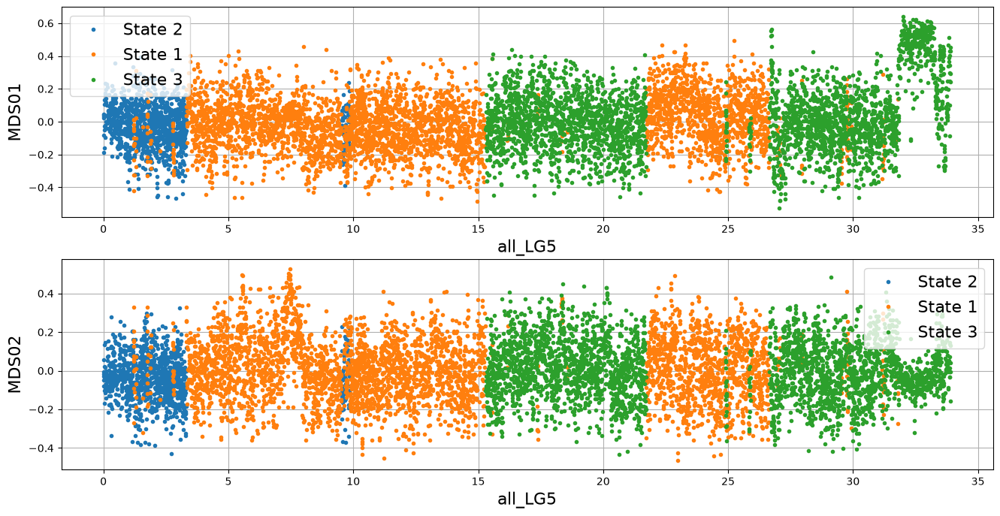

In [2]:
# input RDS data
data_path = "/Volumes/RLaCie/3.SV/4.localPCA/female_genome"
POP = "all"
CHROM = "LG5"
rds_df = pyreadr.read_r( "{}/{}/RDS/{}.{}.win100.lostruct.windows.rds".format(data_path, POP, POP, CHROM))
  
########################## Get mds1-20 ###########################
df_mds =  get_mds_20(rds_df, 20) 

####################### plot the results ###########################
# Run the HMM analysis on the MDS data
states, Z, model = hmm_mds(df_mds)
plot_mds(df_mds, states, Z, data_path, POP, CHROM)

# Target Region

start: 31879615, end: 33178717


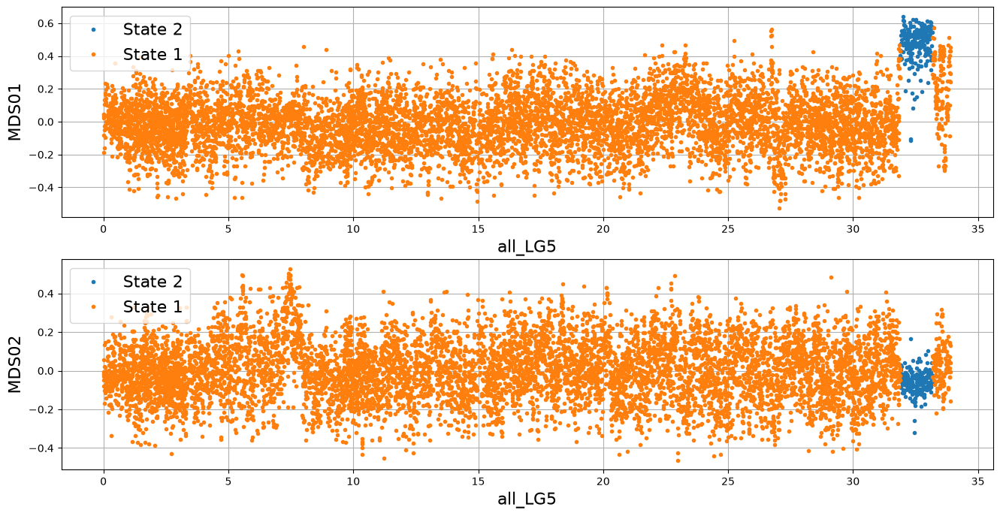

In [3]:
# Retrieve rows from DataFrame based on 'n' value
data = df_mds[df_mds['n'].isin(seq_list[1] + seq_list[1])]
#### define the start and end points
START = int(data.iloc[0]['start'])
END = int(data.iloc[-1]['end'])
print("start: {}, end: {}".format(START, END))
# Initialize with 0
Z_HL = np.zeros(len(df_mds), dtype=int) 
# Mark the desired region as 1
Z_HL[(df_mds["mid"] >= START) & (df_mds["mid"] <= END)] = 1 
# func: plt_mds
plot_mds(df_mds, np.array([1, 0]), Z_HL, data_path, POP, CHROM)

# Read VCF

In [4]:
# all_LG16_cluster0.vcf.gz   
vcffile = "{}/{}/VCF/{}.{}.vcf.gz".format(data_path, POP, POP, CHROM) 
callset = vcf_file_handle(vcffile, data_path, POP, CHROM, START, END)
# func: cal_pca_het_cluster
gn, gf, coords1, model1, sample_list = cal_pca_het_cluster(callset, START, END)
df = cal_het(callset, coords1, START, END)
sort_df = clutering(df, n_clusters=3)
run_vcftools(vcffile, POP, CHROM, START, END, sort_df)

VCFtools ran successfully. Output saved to: /Volumes/RLaCie/3.SV/4.localPCA/female_genome/all/VCF/all_LG5_31.879615-33.178717Mb


# Plotting ###########

In [7]:
###################################################################################################
#################################### 0. setup #####################################################
###################################################################################################
prefix = "{}/{}_{}_{}-{}Mb".format(os.path.dirname(vcffile), POP, CHROM, str(int(START)/1e6),str(int(END)/1e6))

fig = plt.figure(figsize=(45, 45),dpi=200)


# Define grid specification for asymmetric subplots
gs = gridspec.GridSpec(3, 6, height_ratios=[1, 1, 1], width_ratios=[1]*6)  # Adjusting width and height
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.5, hspace=0.20)

##### color scheme
sex = {"F":"o", "M":"^"}
cluster_colors = {0:'#DA9B4F', 1:'#7794C3', 2:'#A3B18A'}
pop_colors = {'ARH':'orangered', 'ARL':'darkred', 'QUH':'olivedrab', 'QUL':'darkgreen', 'YAH':'cornflowerblue', 'YAL':'darkblue'}


###################################################################################################
################################## A. MDS01 plot ##################################################
###################################################################################################
# 1st row, 1st column 
ax1 = plt.subplot(gs[0, 0:2])
# Plotting based on the condition
ax1.scatter(df_mds['mid']/1e6, df_mds['mds01'], 
            color=['blue' if mid > int(START)/1e6 and mid < int(END)/1e6 else 'grey' for mid in df_mds['mid']/1e6],
            s=90, alpha=0.5)


# ax1.set_yticks([-0.4, -0.2, 0, 0.2, 0.4])
ax1.tick_params(axis='both', which='major', labelsize=32)
ax1.set_xlabel('Chromosome (Mb)', fontsize=36, weight='bold')
ax1.set_ylabel('MDS01', fontsize=36, weight='bold')

###################################################################################################
################################### B. PCA plot ###################################################
###################################################################################################
# 2st row, 1st column
ax2 = plt.subplot(gs[1, 0:2])


# Plot scatter data for clusters and populations
for pop in cluster_colors.keys():
    subset = sort_df[(sort_df['cluster_2'] == pop)]
    ax2.scatter(subset['PC1'], subset['PC2'], color=cluster_colors[pop],
                marker='o', s=300)

# Add legend for both clusters and populations
handles_pops, labels_pops = [], []

# lables
pc1=0
pc2=1
ax2.tick_params(axis='both', which='major', labelsize=32)
ax2.set_xlabel(('PC%s (%.1f%%)' % (pc1+1, model1.explained_variance_ratio_[pc1]*100)), fontsize=36, fontweight="bold")
ax2.set_ylabel(('PC%s (%.1f%%)' % (pc2+1, model1.explained_variance_ratio_[pc2]*100)), fontsize=36, fontweight="bold")


###################################################################################################
################################## C. Fst #########################################################
###################################################################################################

ax3 = plt.subplot(gs[0,2:4])

fst = pd.read_csv('{}.windowed.weir.fst'.format(prefix), sep='\t')
# scatter plot

ax3.scatter(fst['BIN_END']/1e6, fst['MEAN_FST'],
            s=120,
            alpha=0.2, 
            color='grey')

# Define the window size for the moving average
window_size = 50  

# Calculate the moving average
fst['Moving_Avg'] = fst['MEAN_FST'].rolling(window=window_size, min_periods=1).mean()


ax3.plot(
    fst['BIN_END'].to_numpy() / 1e6,
    fst['Moving_Avg'].to_numpy(),
    label=f'Moving Average (window={window_size})',
    color='black',
    linewidth=3
)

## blue shade 
ax3.axvspan(int(START)/1e6, int(END)/1e6, color='blue', alpha=0.5)

# Change x-axis and y-axis label
ax3.set_xlabel("Chromosome (Mb)", fontsize=36, weight='bold')
ax3.set_ylabel(r'F$_{ST}$', fontsize=36, weight='bold')
ax3.tick_params(axis='both', which='major', labelsize=32)
# ax3.set_margins(x=0.1,y=0.1)


###################################################################################################
############################### D. heterozygosity plot ############################################
###################################################################################################
# 2nd row, 2nd column 
ax4 = plt.subplot(gs[1,2:4])

# ax4.set_position(ax4.get_position().translated(-0.01, 0))

# plot violin plot for cluster 1 and cluster 0
bplot1 = ax4.boxplot(sort_df.loc[sort_df['cluster_2'] == 0, 'hetero'], positions=[0], widths=0.6,
                    patch_artist=True,  medianprops=dict(color='black'),
                    flierprops=dict(markersize=15), boxprops=dict(linewidth=5),
                    whiskerprops=dict(linewidth=5), capprops=dict(linewidth=5))
bplot2 = ax4.boxplot(sort_df.loc[sort_df['cluster_2'] == 1, 'hetero'], positions=[1], widths=0.6,
                    patch_artist=True,  medianprops=dict(color='black'),
                    flierprops=dict( markersize=15), boxprops=dict(linewidth=5),
                    whiskerprops=dict(linewidth=5), capprops=dict(linewidth=5))
bplot3 = ax4.boxplot(sort_df.loc[sort_df['cluster_2'] == 2, 'hetero'], positions=[2], widths=0.6, 
                    patch_artist=True, medianprops=dict(color='black'),
                    flierprops=dict(markersize=15), boxprops=dict(linewidth=5),
                    whiskerprops=dict(linewidth=5), capprops=dict(linewidth=5))

# color 
colors = ['#DA9B4F', '#7794C3', '#A3B18A']

# Set the facecolor for each box
for bplot, color in zip([bplot1, bplot2, bplot3], colors):
# for bplot, color in zip([bplot1, bplot2], colors):
    for patch in bplot['boxes']:
#         print(color)
        patch.set_color(color)
        patch.set_facecolor(color)
        patch.set_edgecolor('black')
        
ax4.set_xticklabels(["0", "1", "2"])
# ax4.set_xticklabels(["0", "1"])
ax4.tick_params(axis='both', which='major', labelsize=32)
ax4.set_xlabel("Clusters", fontsize=36, fontweight="bold")
ax4.set_ylabel("Heterozygosity", fontsize=36, fontweight="bold")


###################################################################################################
##################################  E. LD map #####################################################
###################################################################################################

ax5 = plt.subplot(gs[0, 4:])

ld_file_path = '{}/{}/LD/{}.{}.100k.ld'.format(data_path, POP, POP, CHROM)
ld_df = pd.read_csv(ld_file_path, sep="\t")

ld_file_path_2 = '{}/{}/LD/{}.{}.100k.ld'.format(data_path, POP, POP, CHROM)
ld_df2 = pd.read_csv(ld_file_path_2, sep="\t")

# Plotting
scatter1 = ax5.scatter(ld_df['win1'] / 10e5, ld_df['win2'] / 10e5, c=ld_df['mean_r2'], cmap="Blues")
scatter2 = ax5.scatter(ld_df2['win2'] / 10e5, ld_df2['win1'] / 10e5, c=ld_df2['mean_r2'], cmap="Blues")

# Create a new axes for the color bar at a specific position relative to ax5
cax_position = [1.02, 0.2, 0.05, 0.5]  # Adjust this to position relative to ax5 # [left, bottom, width, height]
cax = ax5.inset_axes(cax_position)  # This creates an axes object for the colorbar
# cbar_ax = fig.add_axes([0.473, 0.1, 0.006, 0.80])  # DONT use this when do it only in subplot

# Add color bar
cbar = fig.colorbar(scatter1, cax=cax, shrink=0.2)  # Shrink to adjust size
cbar.ax.tick_params(axis='y', labelsize=20)  # Adjust tick size

# Add a custom label at a specific location within the colorbar
cax.text(0.5, 1.05, 'r²', ha='center', va='bottom', fontsize=36, transform=cax.transAxes)

ax5.set_xticks([0, 10, 20, 30])
ax5.set_yticks([0, 10, 20, 30])
ax5.set_xlabel('Chromosome (Mb)', fontsize=36, weight='bold')
ax5.set_ylabel('Chromosome (Mb)', fontsize=36, weight='bold')

ax5.tick_params(axis='both', which='major', labelsize=32)

### bars 
ax5.vlines(x=0.01, ymin=START/1e6 -0.01, ymax=END/1e6 +0.20, color='red', linestyle='-',lw=5)
ax5.hlines(y=0.01, xmin=START/1e6 -0.01, xmax=END/1e6 +0.20, color='red', linestyle='-',lw=5)


###################################################################################################
##################################  F. Proportion plot ############################################
###################################################################################################
# Subplot for the proportion plot
ax9 = plt.subplot(gs[1, 4:]) # Row 2, spanning Columns 4 to 5

# Calculate the proportion of each cluster in YAL and YAH
proportion = sort_df.groupby('pop')['cluster_2'].value_counts(normalize=True).unstack().fillna(0)

# Plotting the bar plot
proportion.plot(kind='bar', width=0.5, ax=ax9, color=cluster_colors, edgecolor='black', linewidth=2, legend=False)

# Customize plot labels
ax9.set_xlabel("Populations", fontweight="bold", fontsize=36)
ax9.set_ylabel("Proportion", fontweight="bold", fontsize=36)
ax9.set_xticklabels(ax9.get_xticklabels(), rotation=0, fontsize=30)


##############################################################################
######################### G(1). clustering ###################################
##############################################################################
# Row 2, spanning Columns 0 and 1
ax8 = plt.subplot(gs[2, 0:1]) 
ax8.set_position(ax8.get_position().translated(-0.01, 0))

# Prepare the genotype matrix and hierarchical clustering
genotype_matrix = gf.to_n_alt().T  
genotype_df = pd.DataFrame(genotype_matrix)

# Calculate distance matrix using Euclidean distance and Ward method
dist_matrix = scipy.spatial.distance.pdist(genotype_matrix, metric='euclidean')
Z = linkage(dist_matrix, method="ward")

dendro = dendrogram(Z, orientation='left',
                    color_threshold=0,
                    above_threshold_color='black',
                    # labels=callset['samples'],  # Uncomment if you need sample labels
                    leaf_font_size=36,
                    leaf_rotation=0,
                    distance_sort="ascending",
                    ax=ax8) 

for line in ax8.collections:
    line.set_linewidth(5) 
    
# Set color palette for dendrogram
scipy.cluster.hierarchy.set_link_color_palette(colors[::-1])


ax8.set_frame_on(False)  # Hide frame
ax8.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)  # Hide y-axis ticks and labels
ax8.set_yticklabels([])  # Clear any remaining y-axis labels

###################################################################################################
##################################### G(2). GT plot ###############################################
###################################################################################################
# 3rd row, side 
ax7 = plt.subplot(gs[2, 1:4])  
ax7.set_position(ax7.get_position().translated(-0.038, 0))

leaf_order = dendro['leaves']

sample_names = genotype_df.index[dendro['leaves']]
ordered_sample_names = callset['samples'][dendro['leaves']]

total_list = []
for i in callset['calldata/GT']:
    tmp_list = []
    for x in i:
        tmp_list.append(sum(x))
    total_list.append(tmp_list)
total_list = np.array(total_list)


# sort the list
total_list_sort = []
# for i in sort_df.index:
for i in sample_names.tolist():
    total_list_sort.append(total_list[:,i])
total_list_sort = np.array(total_list_sort)

total_list_sort = total_list[:, leaf_order].T


## color scheme
sample_list = list(ordered_sample_names)
sample_color = [pop_colors[sample[:2].upper() + "H"] if 'H' in sample else pop_colors[sample[:2].upper() + "L"] for sample in sample_list]


# cluster
cluster_list = list(sort_df['cluster'])
cluster_list = []
# Iterate through ordered_sample_names and fetch the corresponding cluster_2 value
for sample in ordered_sample_names:
    # Get the cluster_2 value for the current sample
    cluster_2_value = sort_df.loc[sort_df['samples'] == sample, 'cluster_2'].values
    cluster_list.append(cluster_2_value[0])
    

# Assuming cluster_list contains values 0, 1, 2
cluster_color = ['#DA9B4F' if cluster == 0 else '#7794C3' if cluster == 1 else '#A3B18A' for cluster in cluster_list]


# Customize colors as needed
lut = dict(zip(sample_list, sample_color))  
row_colors = [lut[sp] for sp in sample_list]

# Create the first colorbar, sample colorbar for the heatmap
cbar_ax = ax7.inset_axes([-0.04, 0, 0.016, 1]) # [left, bottom, width, height] 
cbar = mpl.colorbar.ColorbarBase(cbar_ax, 
                                 cmap=mpl.colors.ListedColormap(list(lut.values())), 
                                 orientation='vertical',
                                 ticks=[])

# Cluster colorbar 
lut2 = dict(zip(cluster_list, cluster_color))  
row_colors2 = [lut2[sp] for sp in cluster_list]

# Create color bar, cluster an inset axes within ax7
cbar_ax2 = ax7.inset_axes([-0.02, 0, 0.016, 1]) # [left, bottom, width, height] d
cbar2 = mpl.colorbar.ColorbarBase(cbar_ax2, 
                                  cmap=mpl.colors.ListedColormap(cluster_color), 
                                  orientation='vertical', 
                                  ticks=[])


# Define the colormap with the desired colors including grey for -2
cmap = mpl.colors.ListedColormap(['pink', 'green', 'white',  'orange']) # -2, 0, 1, 2

# Define normalization to map values to colormap boundaries, including -2
norm = mpl.colors.BoundaryNorm(boundaries=[-2.5, -0.5, 0.5, 1.5, 2.5], ncolors=cmap.N)

# Plot the heatmap with pcolormesh, using the specified colormap and normalization
pcm = ax7.pcolormesh(total_list_sort, cmap=cmap, norm=norm, edgecolors='face')

ax7.tick_params(axis='y', which='major', left=True, labelsize=20)
ax7.tick_params(axis='x', which='major', labelsize=32)

# Set y-axis tick labels and adjust their position
y_ticks = np.arange(0.5, total_list_sort.shape[0] + 0.5, 1)


# # Create a legend
legend_labels = [' ./.', ' 0/0 ', ' 0/1 ', ' 1/1 ']
legend_colors = ['pink', 'green', 'white',  'orange']

# Cluster legend
legend_cluster_labels = cluster_colors.keys()
legend_cluster_colors = cluster_colors.values()

# Population legend
legend_pop_labels = ["ARH", "ARL", "QUH", "QUL", "YAH", "YAL"]
legend_pop_colors = [pop_colors[i] for i in legend_pop_labels]


# --- Genotype Legend ---
# Create empty bars for Genotype
handles, labels = [], []
for color, label in zip(legend_colors, legend_labels):
    handles.append(mpl_patches.Rectangle((0, 0), 1, 2, color=color))  # Create a bar for the legend
    labels.append(label)

# Create the Genotype legend and add it to the plot
handles = [mpl_patches.Rectangle((0, 0), 1, 1, facecolor=color, edgecolor='black') 
           for color in legend_colors]

# Create the Genotype legend with frame around each label
first_legend = ax7.legend(handles, labels, title='Genotype', loc=[1.01, 0.7],
                          handlelength=2, title_fontsize=20, fontsize=20,
                          frameon=True)  # Make sure the frame is visible
ax7.add_artist(first_legend)

# --- Cluster Legend ---
handles, labels = [], []
for color, label in zip(legend_cluster_colors, legend_cluster_labels):
    handles.append(mpl_patches.Rectangle((0, 0), 1, 2, color=color))  
    labels.append(label)

# Create the Cluster legend and add it to the plot
second_legend = ax7.legend(handles, labels, title='Cluster', loc=[1.01, 0.06], 
                           handlelength=2, title_fontsize=20, fontsize=20,
                          frameon=True)
ax7.add_artist(second_legend)

# --- Population Legend ---
handles, labels = [], []
for color, label in zip(legend_pop_colors, legend_pop_labels):
    handles.append(mpl_patches.Rectangle((0, 0), 1, 2, color=color))
    labels.append(label)

# Create the Population legend and add it to the plot
ax7.legend(handles, labels, title='Population', loc=[1.01, 0.30], 
           handlelength=2, title_fontsize=20, fontsize=20,
          frameon=True)

# Set X and Y labels
ax7.set_xlabel("{} {}, {:.2f}-{:.2f}Mb".format(POP, CHROM.replace("LG","Chr"), int(START)/1e6, int(END)/1e6), fontweight="bold", fontsize=36)
ax7.set_yticklabels([])  


###################################################################################################
################################## H. phylogeny plot ##############################################
###################################################################################################
ax6 = plt.subplot(gs[2, 4:])
img = imread("/Volumes/RLaCie//3.SV/0.Scripts/{}.png".format(CHROM))
ax6.imshow(img)
ax6.axis('off') 


###########################################################################
############################# final setup #################################
###########################################################################
# Panel labels
ax1.annotate('A', xy=(-0.15, 1.02), xycoords="axes fraction", fontsize=40, fontweight='bold', va='center')
ax2.annotate('B', xy=(-0.15, 1.02), xycoords="axes fraction", fontsize=40, fontweight='bold', va='center')
ax3.annotate('C', xy=(-0.15, 1.02), xycoords="axes fraction", fontsize=40, fontweight='bold', va='center')
ax4.annotate('D', xy=(-0.15, 1.02), xycoords="axes fraction", fontsize=40, fontweight='bold', va='center')
ax5.annotate('E', xy=(-0.15, 1.02), xycoords="axes fraction", fontsize=40, fontweight='bold', va='center')
ax6.annotate('H', xy=(-0.15, 1.02), xycoords="axes fraction", fontsize=40, fontweight='bold', va='center')
ax8.annotate('G', xy=(-0.15, 1.02), xycoords="axes fraction", fontsize=40, fontweight='bold', va='center')
ax9.annotate('F', xy=(-0.15, 1.02), xycoords="axes fraction", fontsize=40, fontweight='bold', va='center')

for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax9]:
    ax.spines['top'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_linewidth(2)
    ax.tick_params(axis='both', which='both', direction='out', length=10, width=3, labelsize=32)


plt.savefig("{}/{}/{}_{}_{:.2f}-{:.2f}.png".format(data_path, POP, POP, CHROM, int(START)/1e6, int(END)/1e6),
    format='png',
    bbox_inches='tight',
    dpi=200)

plt.show()

#colors ={'ARH':'orangered', 'ARL':'darkred', 'QUH':'olivedrab', 'QUL':'darkgreen', 'YAH':'cornflowerblue', 'YAL':'darkblue'}